In [1]:
# Project-relative paths: no machine-specific absolute paths are required.
from pathlib import Path

PROJECT_ROOT = Path.cwd().resolve()
for _candidate in (PROJECT_ROOT, *PROJECT_ROOT.parents):
    if (_candidate / "workspace" / "Source_Data.xlsx").exists():
        PROJECT_ROOT = _candidate
        break
else:
    raise FileNotFoundError(
        "workspace/Source_Data.xlsx was not found. Run the notebook from inside the repository."
    )

WORKSPACE_DIR = PROJECT_ROOT / "workspace"
(WORKSPACE_DIR / "figures").mkdir(parents=True, exist_ok=True)
(WORKSPACE_DIR / "figures_R3").mkdir(parents=True, exist_ok=True)

clean_data_path = WORKSPACE_DIR.as_posix().rstrip("/") + "/"
clean_data_path_yy = clean_data_path
clean_data_path_wzj = clean_data_path
clean_data_path_zzh = clean_data_path
path = clean_data_path
show_dir = clean_data_path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
import matplotlib.image as mpimg
# import cv2
from mpl_toolkits.axes_grid1 import make_axes_locatable
# Suppress warning messages.
warnings.filterwarnings('ignore')


In [2]:
bands = {
    'theta': (4, 8),
    'alpha': (8, 12),
    'beta1': (12, 24),
    'beta2': (24, 40),
    'low_gamma': (40, 70),
    'high_gamma': (70, 150)
}

band = 'high_gamma'

# Ext. Fig. 6a

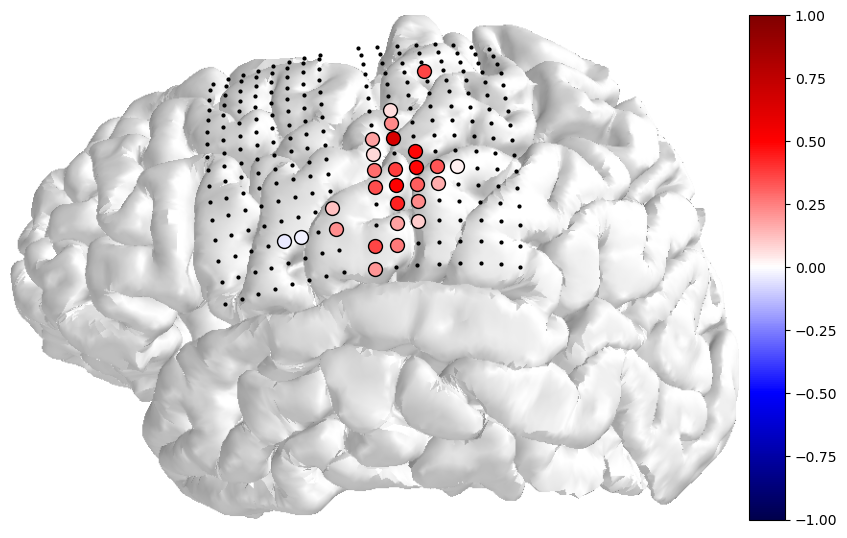

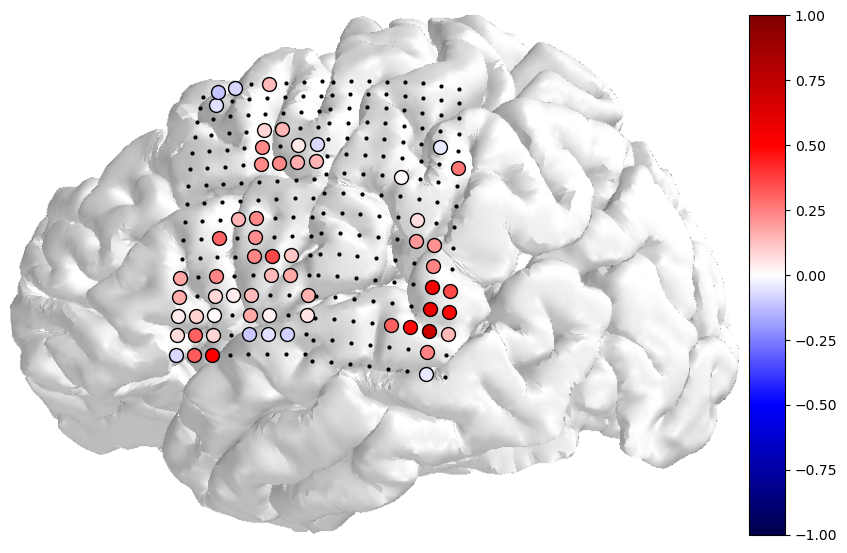

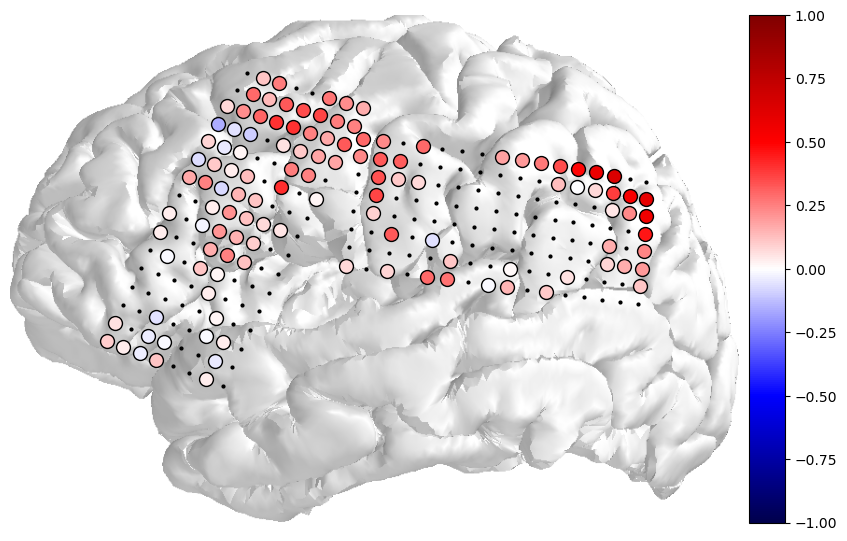

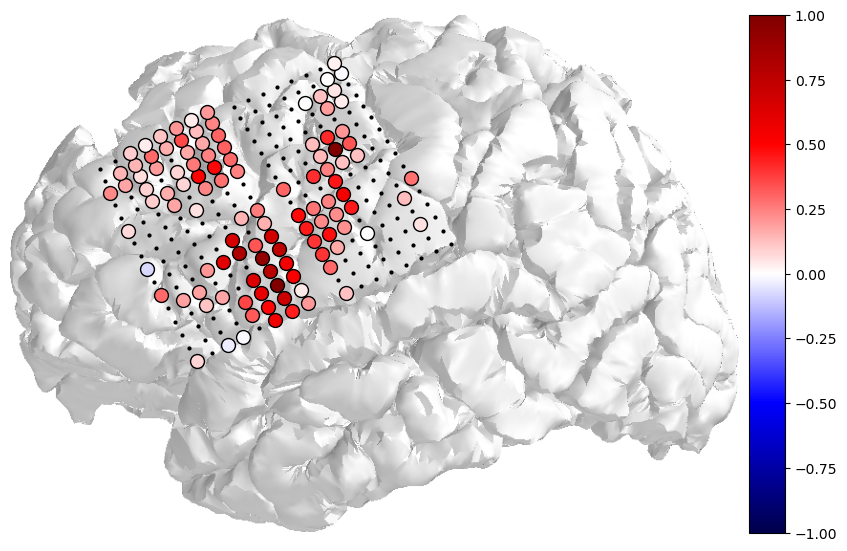

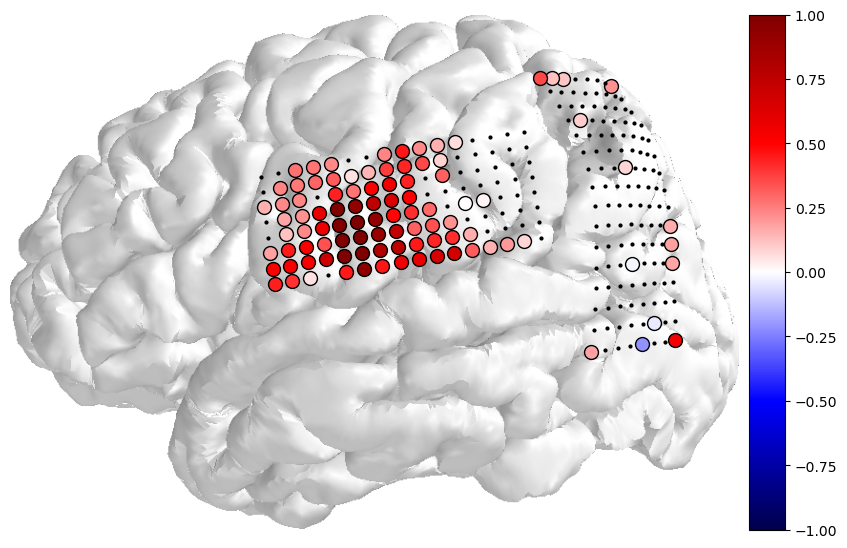

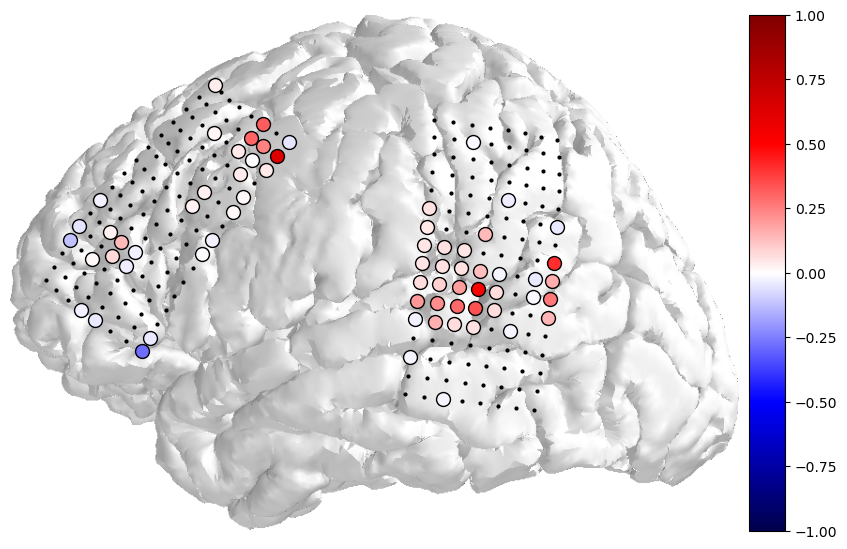

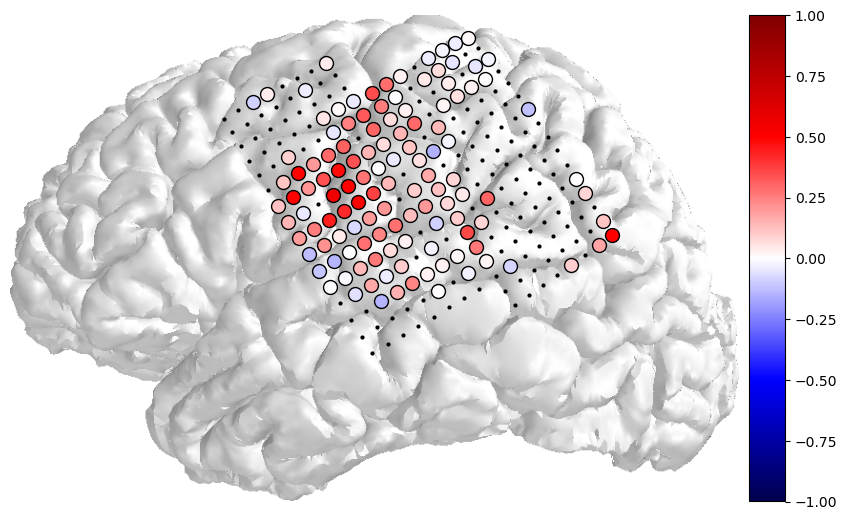

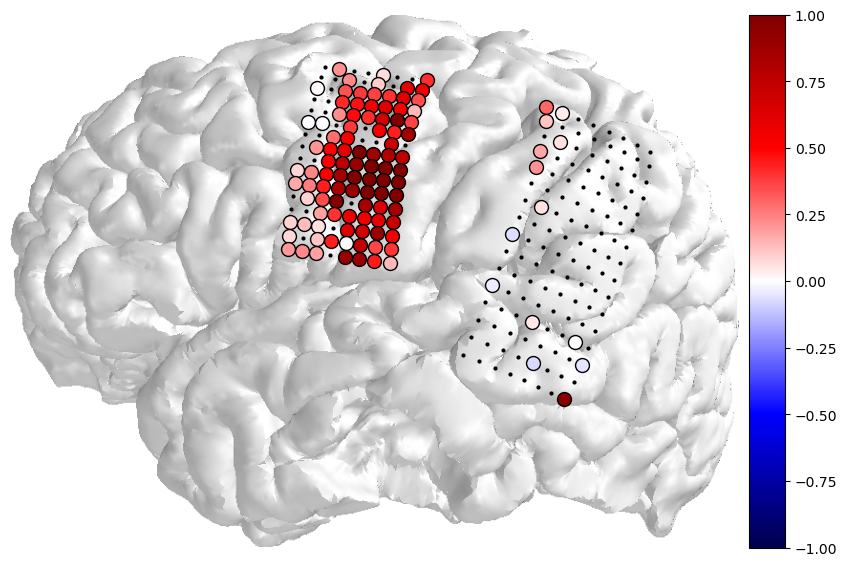

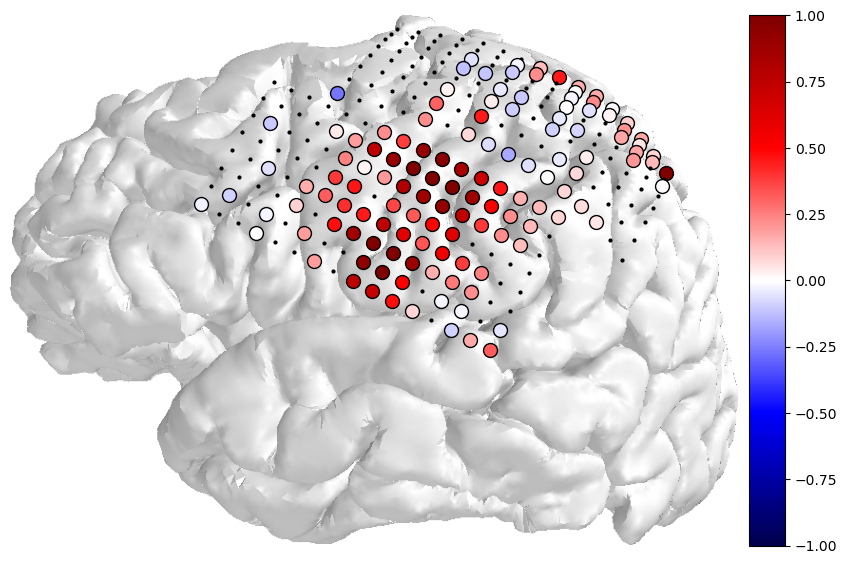

In [3]:
fig_num = 'Ext_Fig_6a'
subjects = [45, 47, 48, 50, 54, 71, 73, 76, 78]
for HS in subjects:
    idx = str(subjects.index(HS) + 1)
    task_name='overt'
    df=pd.read_excel(
        clean_data_path+"/Source_Data.xlsx",
        sheet_name='Ext. Fig. 6a'
    )

    df=df[
        (df.Subject==f"HS{HS}")&
        (df.Task==task_name)
    ]

    cmap_name = "seismic"

    # Load the brain background image.
    img = mpimg.imread(
        clean_data_path +
        f"/elecs/Brain2D/HS{HS}_brain2D.png"
    )

    # Create the figure and axes.
    fig, ax = plt.subplots(figsize=(10, 10))

    # Display the brain background image.
    ax.imshow(img)

    # Configure the color map.
    sm = plt.cm.ScalarMappable(
        cmap=plt.get_cmap(cmap_name),
        norm=plt.Normalize(-1, 1)
    )

    # Plot the electrodes.
    for _, row in df.iterrows():

        if row.is_sig:

            ax.plot(
                row.X,
                row.Y,
                marker='o',
                color=sm.to_rgba(row.avg_ecog),
                markeredgecolor='k',
                markersize=10
            )

        else:

            ax.plot(
                row.X,
                row.Y,
                marker='o',
                color='k',
                markersize=2
            )

    ax.axis("off")

    # Create a dedicated axis for the color bar.
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    plt.colorbar(sm,cax=cax)
    plt.show()
    fig.savefig(path+f'/figures_R3/{fig_num}_Subject_S'+idx+f'_{band}.pdf', transparent=True)

# Ext. Fig. 6b

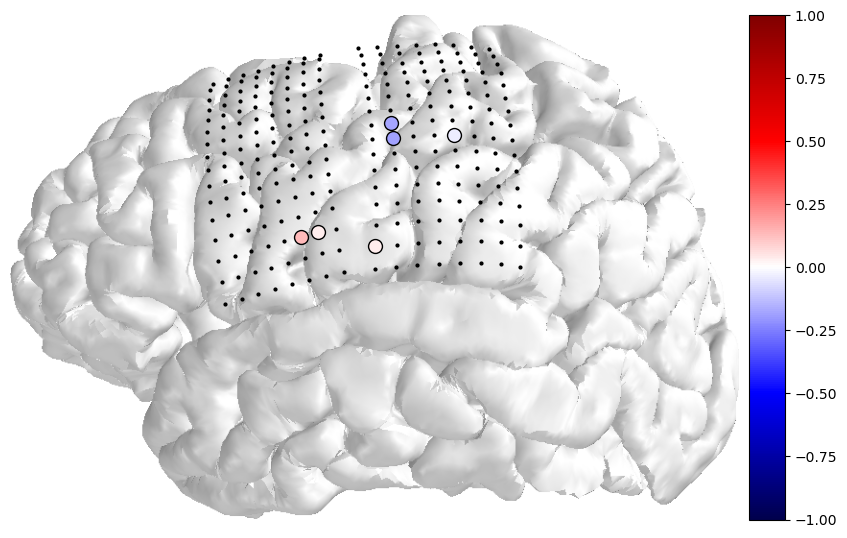

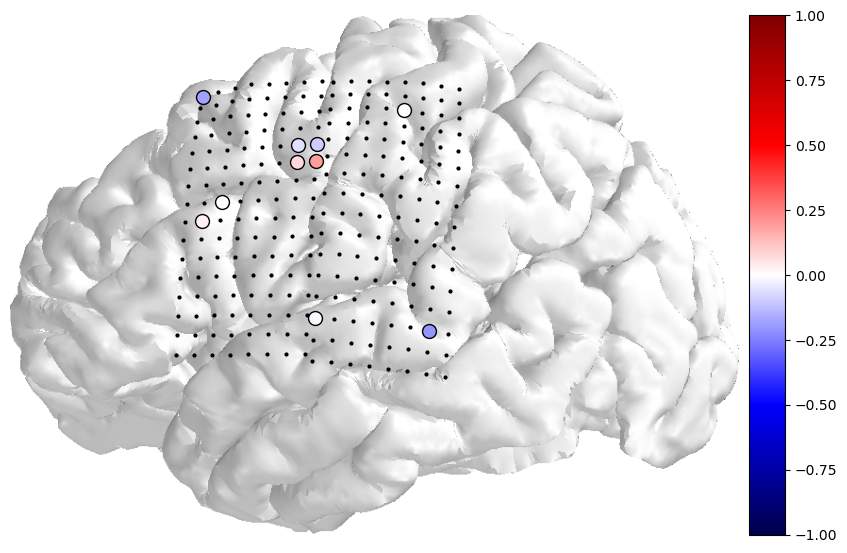

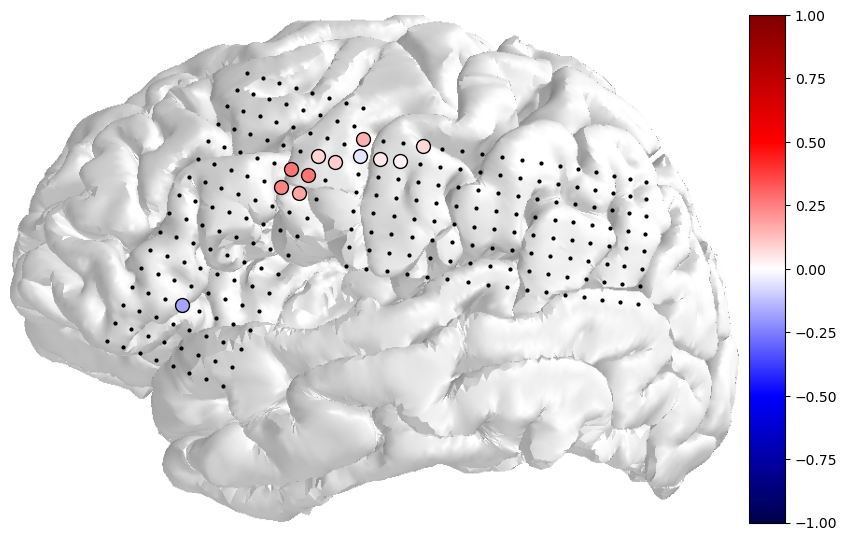

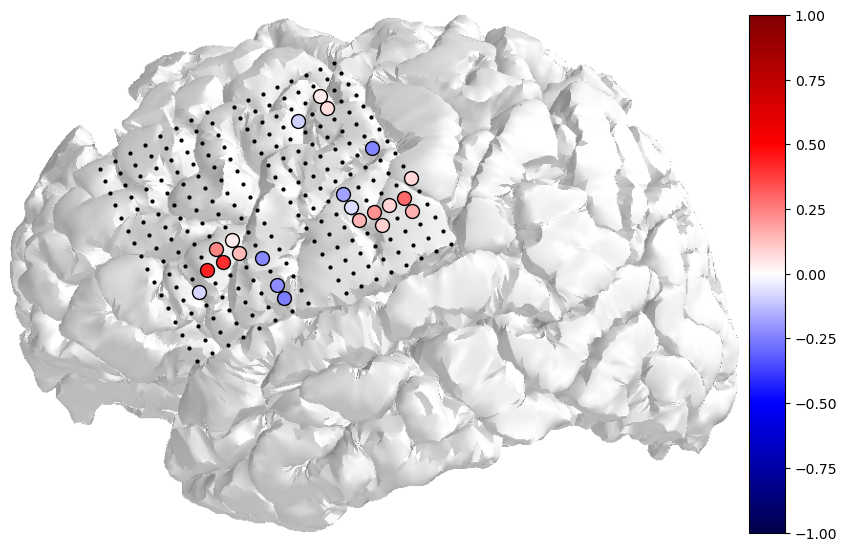

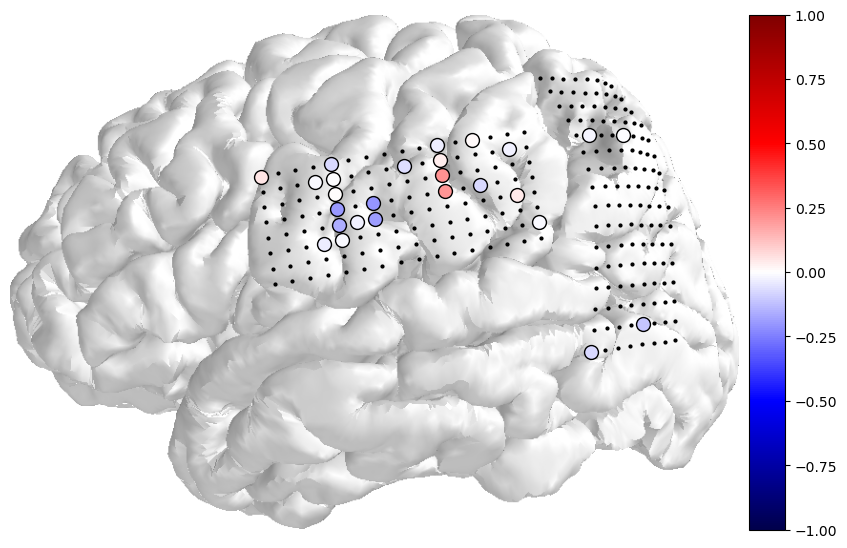

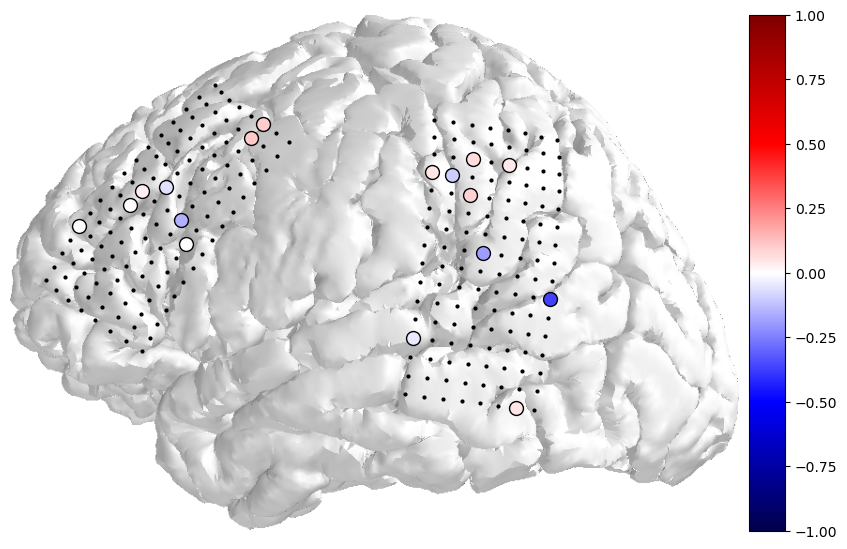

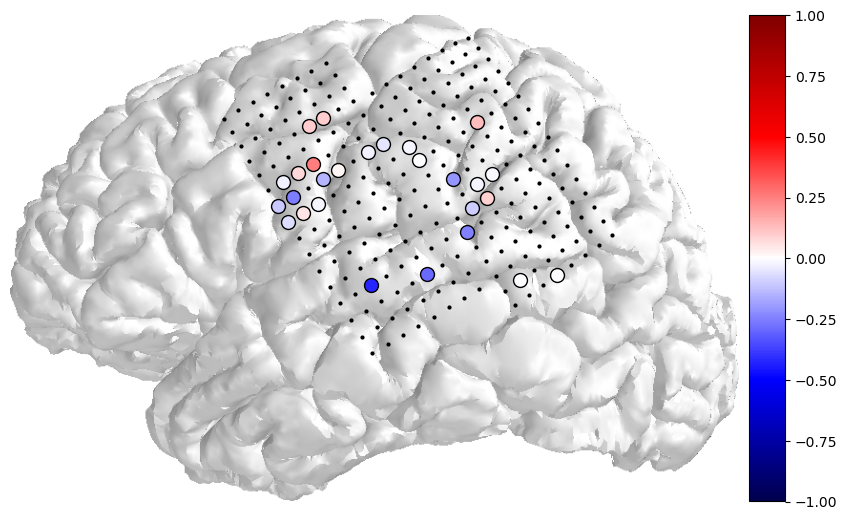

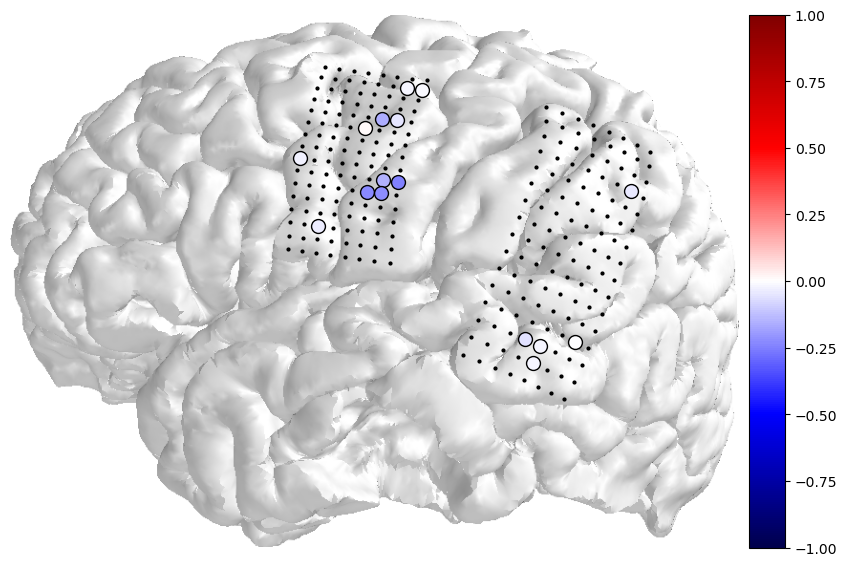

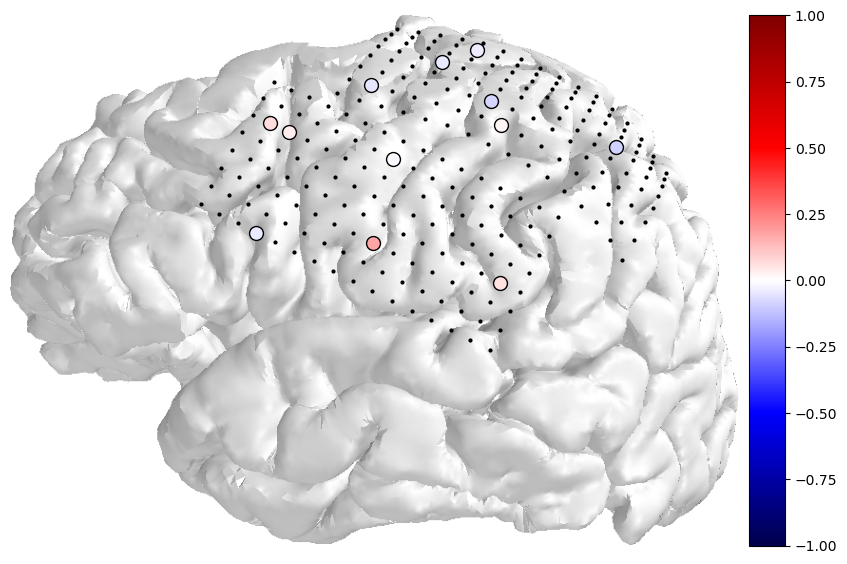

In [4]:
fig_num = 'Ext_Fig_6b'
subjects = [45, 47, 48, 50, 54, 71, 73, 76, 78]
for HS in subjects:
    idx = str(subjects.index(HS) + 1)
    task_name='covert'
    df=pd.read_excel(
        clean_data_path+"/Source_Data.xlsx",
        sheet_name="Ext. Fig. 6b"
    )

    df=df[
        (df.Subject==f"HS{HS}")&
        (df.Task==task_name)
    ]

    cmap_name = "seismic"

    # Load the brain background image.
    img = mpimg.imread(
        clean_data_path +
        f"/elecs/Brain2D/HS{HS}_brain2D.png"
    )

    # Create the figure and axes.
    fig, ax = plt.subplots(figsize=(10, 10))

    # Display the brain background image.
    ax.imshow(img)

    # Configure the color map.
    sm = plt.cm.ScalarMappable(
        cmap=plt.get_cmap(cmap_name),
        norm=plt.Normalize(-1, 1)
    )

    # Plot the electrodes.
    for _, row in df.iterrows():

        if row.is_sig:

            ax.plot(
                row.X,
                row.Y,
                marker='o',
                color=sm.to_rgba(row.avg_ecog),
                markeredgecolor='k',
                markersize=10
            )

        else:

            ax.plot(
                row.X,
                row.Y,
                marker='o',
                color='k',
                markersize=2
            )

    ax.axis("off")

    # Create a dedicated axis for the color bar.
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    plt.colorbar(sm,cax=cax)
    plt.show()
    fig.savefig(path+f'/figures_R3/{fig_num}_Subject_S'+idx+f'_{band}.pdf', transparent=True)

In [5]:
def venn_in_individual_brain(HS, fig_num):
    subject = f'HS{HS}'
    idx = str(subjects.index(HS) + 1)

    img = mpimg.imread(
        clean_data_path +
        f"/elecs/Brain2D/{subject}_brain2D.png"
    )
    df_sub = df[df.Subject == subject]
    fig, ax = plt.subplots(figsize=(10,8))
    ax.imshow(img)
    for _, row in df_sub.iterrows():
        x = row.X
        y = row.Y
        if row.Category == "finger_motor":
            ax.plot(x, y, "*", color="green",
                    markeredgecolor='k', markersize=10)
        elif row.Category == "dual-responsive":
            ax.plot(x, y, "o", color="#CFB7CF",
                    markeredgecolor='k', markersize=10)
        elif row.Category == "overt":
            ax.plot(x, y, "o", color="#D5645B",
                    markeredgecolor='k', markersize=10)
        elif row.Category == "covert":
            ax.plot(x, y, "o", color="#88BBDF",
                    markeredgecolor='k', markersize=10)
        else:
            ax.plot(x, y, "o", color="k", markersize=2)

    ax.axis("off")

    plt.show()
    fig.savefig(path+f'/figures_R3/{fig_num}_Subject_S'+idx+f'_{band}.pdf', transparent=True)

# Ext. Fig. 3b

In [6]:
import pandas as pd
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import make_axes_locatable

source_file = clean_data_path + "/Source_Data.xlsx"
df = pd.read_excel(source_file, sheet_name="Ext. Fig. 3b")
subjects = [45, 50]

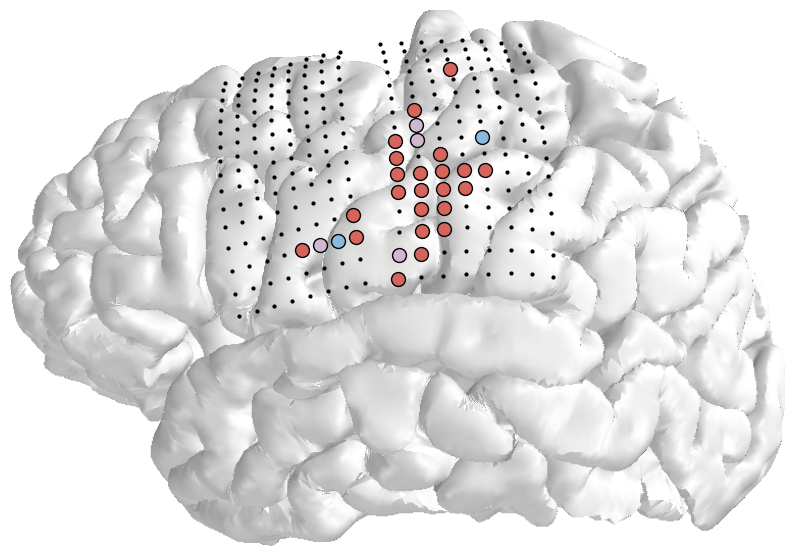

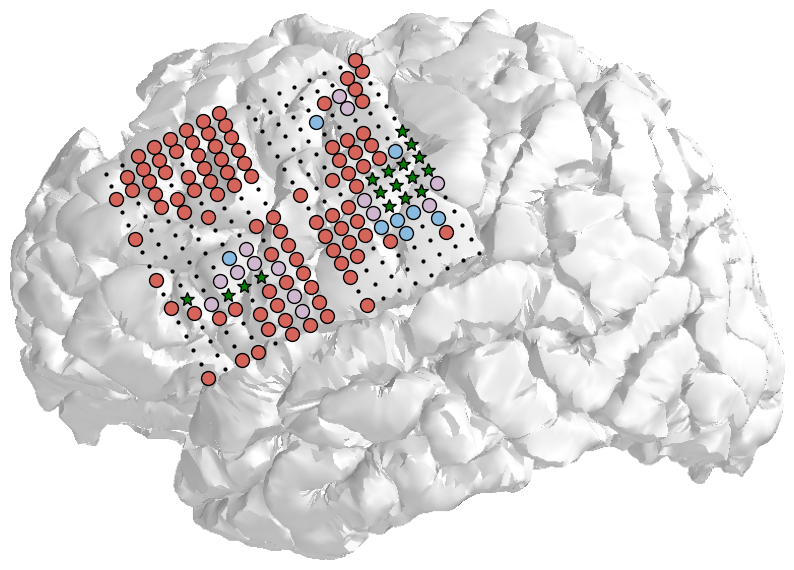

In [7]:
fig_num = 'Ext_Fig_3b'
for HS in [45, 50]:
    venn_in_individual_brain(HS, fig_num)

# Ext. Fig. 4b

In [8]:
import pandas as pd
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import make_axes_locatable

source_file = clean_data_path + "/Source_Data.xlsx"
df = pd.read_excel(source_file, sheet_name="Ext. Fig. 4b")
subjects = [45, 47, 48, 50, 54, 71, 73, 76, 78]

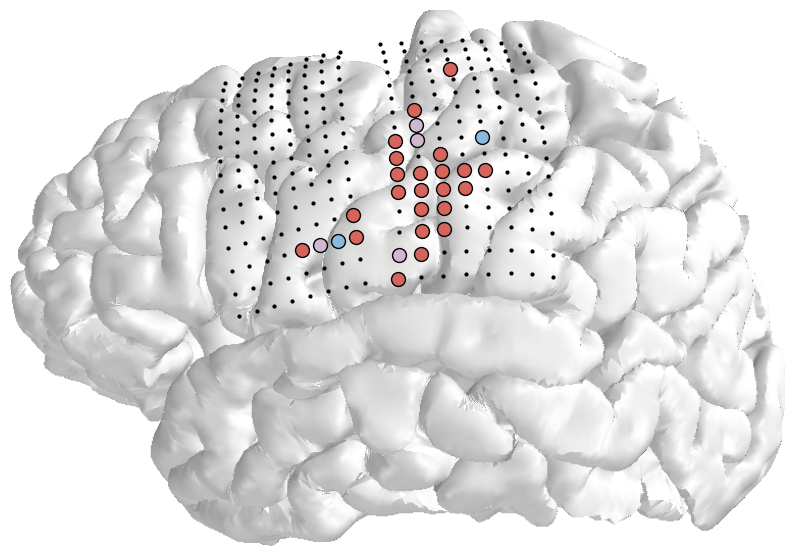

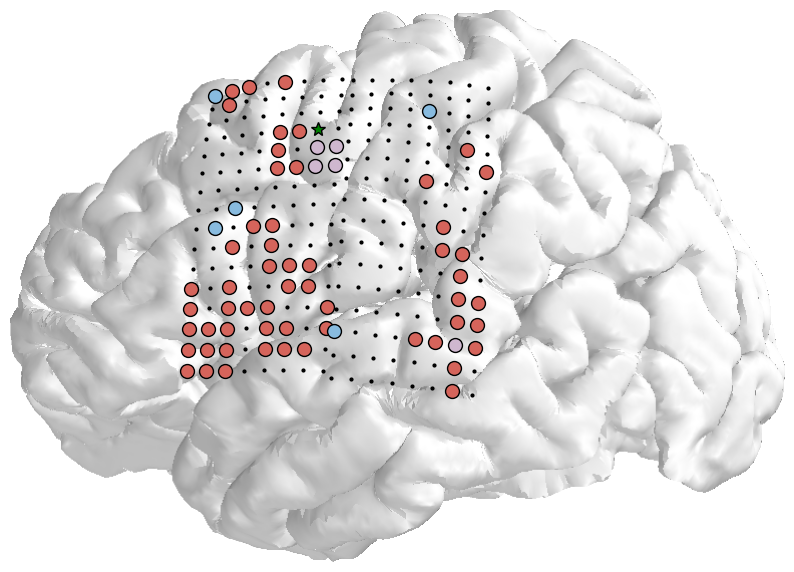

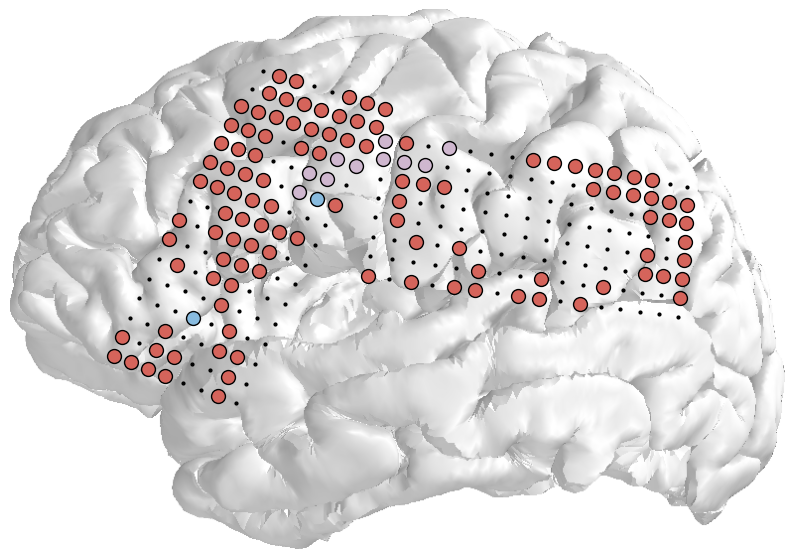

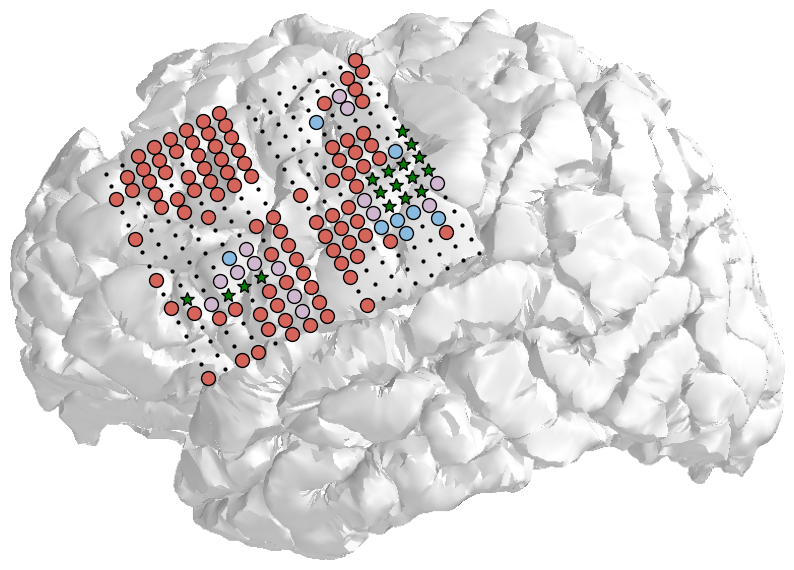

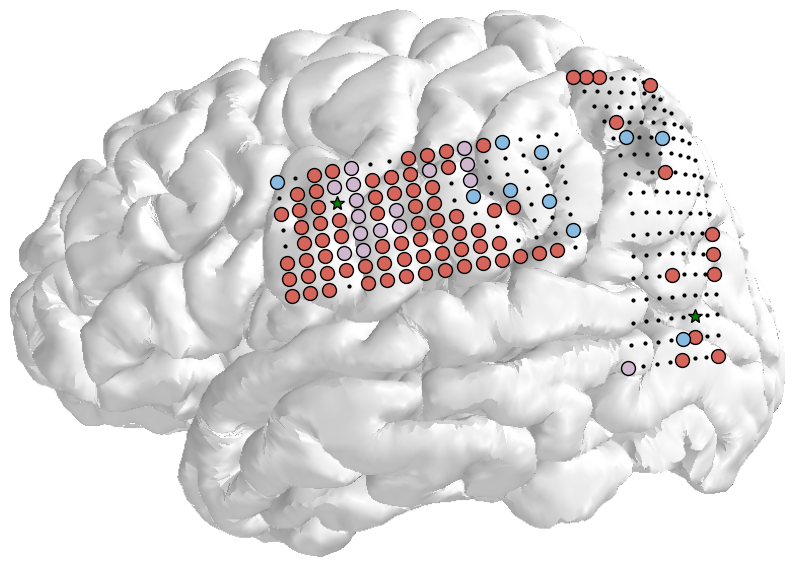

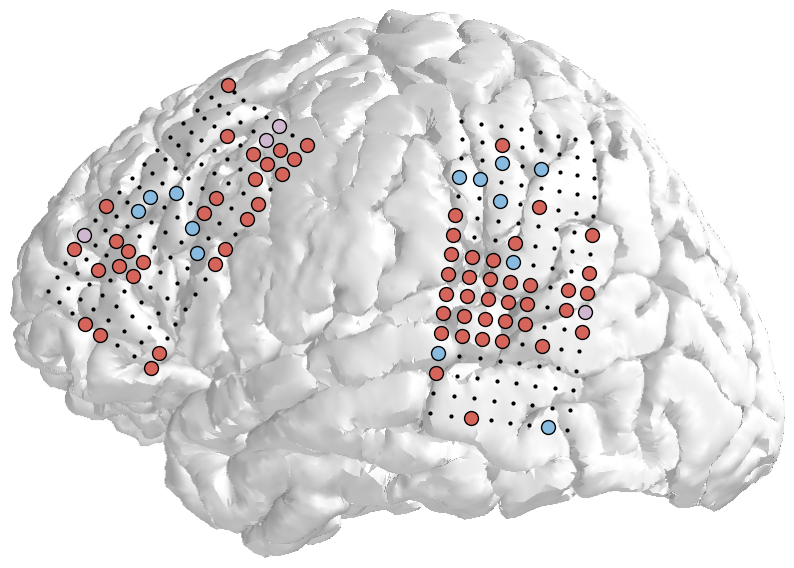

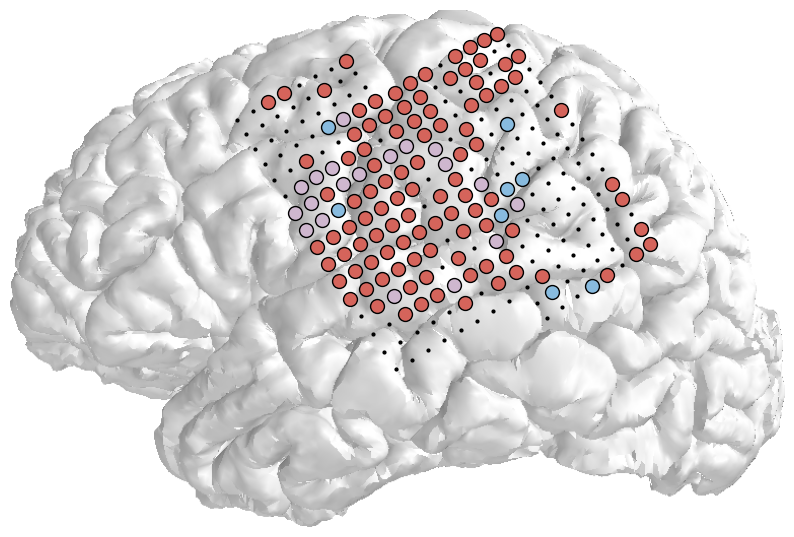

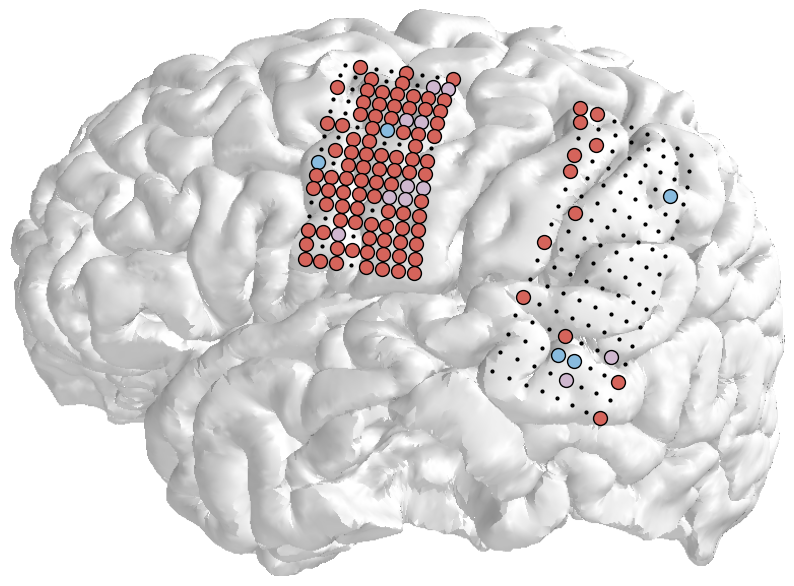

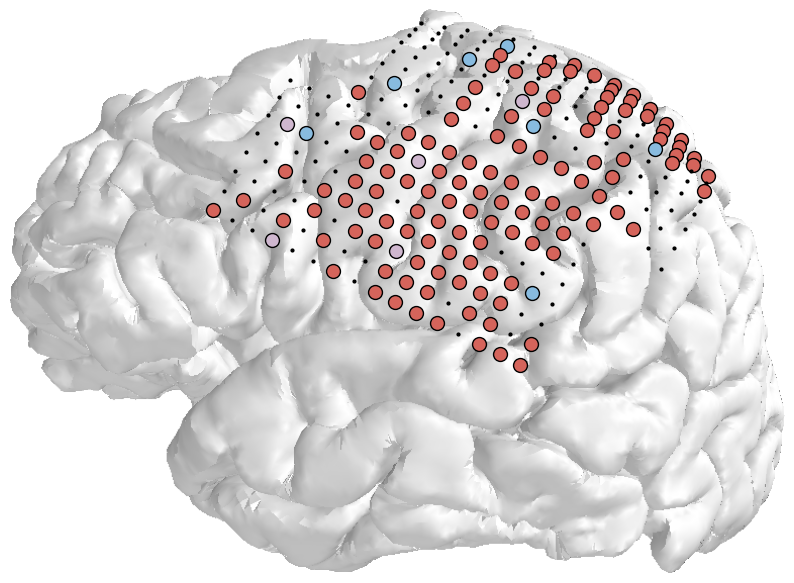

In [9]:
fig_num = 'Ext_Fig_4b'
for HS in [45, 47, 48, 50, 54, 71, 73, 76, 78]:
    venn_in_individual_brain(HS, fig_num)

# Ext. Fig. 3c

Spearman r = 0.19
P = 8.64e-02


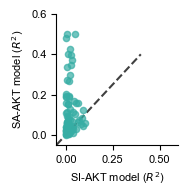

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
# ==========================
# Read the Source Data workbook.
# ==========================
df = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3c-d"
)

# ==========================
# Calculate the correlation.
# ==========================
correlation, p_value = spearmanr(
    df["trace_r2_c"],
    df["trace_r2_o"]
)

print(f"Spearman r = {correlation:.2f}")
print(f"P = {p_value:.2e}")

# ==========================
# Define the color palette.
# ==========================
n_cluster = df["cluster"].nunique()
unique_clusters = sorted(df["cluster"].unique())

color_list = sns.color_palette("husl")
# color_list = sns.color_palette("husl")

# ==========================
# Create the plot.
# ==========================
plt.style.use('default')
plt.rc('font', family='Arial', size=8)

plt.figure(figsize=(2, 2))

plt.scatter(
    df["trace_r2_c"],
    df["trace_r2_o"],
    c=color_list[3],
    s=20,
    alpha=0.7,
    linewidth=1
)

plt.xlabel('SI-AKT model ($R^2$)')
plt.ylabel('SA-AKT model ($R^2$)')

lims = [-0.05, 0.6]
plt.xlim(lims)
plt.ylim(lims)

# Add the diagonal reference line.
plt.plot(
    [-0.05, 0.4],
    [-0.05, 0.4],
    'k--',
    alpha=0.75,
    zorder=0
)

# ==========================
# Print the number of electrodes in each cluster.
# ==========================
cluster_counts = df["cluster"].value_counts().sort_index()

# ==========================
# Apply final axis formatting.
# ==========================
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()

# ==========================
# Save the figure.
# ==========================
save_path = clean_data_path + "figures_R3/Ext. Fig. 3c.tiff"

plt.savefig(
    save_path,
    dpi=300,
    bbox_inches='tight'
)

plt.show()

# Ext. Fig. 3d

SI-AKT:
Median=0.014, Q1=0.005, Q3=0.029, N=80
SA-AKT:
Median=0.062, Q1=0.026, Q3=0.158, N=80
Wilcoxon statistic = 292.000
P = 1.897e-10


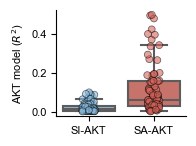

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import wilcoxon

# ==========================
# Read the Source Data workbook.
# ==========================
df = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3c-d"
)

x = df["trace_r2_c"]
y = df["trace_r2_o"]

# ==========================
# Calculate statistical tests.
# ==========================
stat, p_value = wilcoxon(x, y)

def describe_quartiles(series):
    return {
        "N": len(series),
        "median": np.median(series),
        "Q1": np.percentile(series, 25),
        "Q3": np.percentile(series, 75)
    }

x_desc = describe_quartiles(x)
y_desc = describe_quartiles(y)

print("SI-AKT:")
print(
    f"Median={x_desc['median']:.3f}, "
    f"Q1={x_desc['Q1']:.3f}, "
    f"Q3={x_desc['Q3']:.3f}, "
    f"N={x_desc['N']}"
)

print("SA-AKT:")
print(
    f"Median={y_desc['median']:.3f}, "
    f"Q1={y_desc['Q1']:.3f}, "
    f"Q3={y_desc['Q3']:.3f}, "
    f"N={y_desc['N']}"
)

print(f"Wilcoxon statistic = {stat:.3f}")
print(f"P = {p_value:.3e}")

# ==========================
# Create the plot.
# ==========================
plt.figure(figsize=(2, 1.5))

sns.boxplot(
    data=[x, y],
    palette=['#88BBDF', '#D6655B'],
    showfliers=False
)

sns.stripplot(
    data=[x, y],
    palette=['#88BBDF', '#D6655B'],
    size=5,
    jitter=True,
    alpha=0.6,
    edgecolor='k',
    linewidth=0.5
)

plt.xticks([0, 1], ["SI-AKT", "SA-AKT"])
plt.ylabel("AKT model ($R^2$)")

ax = plt.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()

# ==========================
# Save the figure.
# ==========================
save_path = clean_data_path + "figures_R3/Ext. Fig. 3d.tiff"

plt.savefig(
    save_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# Ext. Fig. 3p

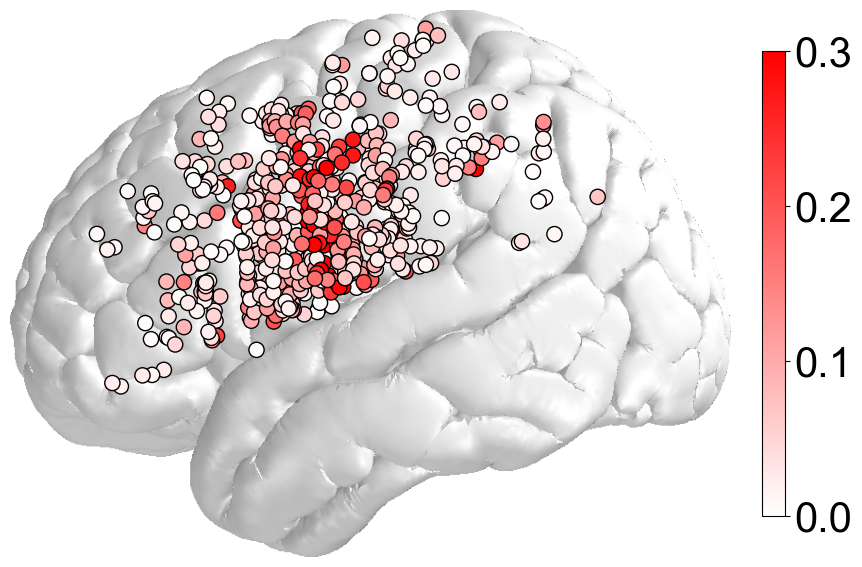

In [12]:
df = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3p"
)

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.colors as mcolors

edge_color_map = {
    "SA": "red",
    "SI": "blue"
}

def plot_fig3(task):
    img = mpimg.imread(path + "/elecs/MNI.png")
    df_plot = df[df["cluster_SA"] == task]
    fig, ax = plt.subplots(figsize=(10,8))
    ax.imshow(img)
    cmap = mcolors.LinearSegmentedColormap.from_list(
        f"{task}_cmap",
        ["white", edge_color_map[task]]
    )

    norm = mcolors.Normalize(
        vmin=0,
        vmax=0.30
    )

    sc = ax.scatter(
        df_plot["x"],
        df_plot["y"],
        c=df_plot["trace_r2_o"],
        cmap=cmap,
        norm=norm,
        edgecolors="k",
        linewidths=1,
        s=120
    )


    # Add the color bar.
    cbar = plt.colorbar(sc, ax=ax, fraction=0.03, pad=0.04)
    cbar.ax.tick_params(labelsize=30)
    ax.axis("off")

    plt.savefig(
        clean_data_path +
        f"figures_R3/Ext. Fig. 3p.tiff",
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    
plot_fig3("SA")

# Ext. Fig. 3q

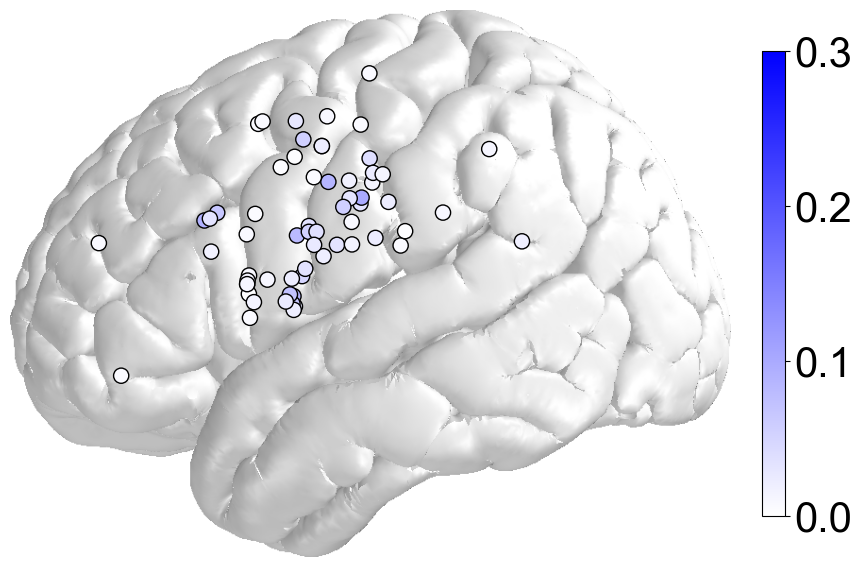

In [13]:
df = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3q"
)

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.colors as mcolors

edge_color_map = {
    "SA": "red",
    "SI": "blue"
}

def plot_fig3_c(task):
    img = mpimg.imread(path + "/elecs/MNI.png")
    df_plot = df[df["cluster_SI"] == task]
    fig, ax = plt.subplots(figsize=(10,8))
    ax.imshow(img)
    cmap = mcolors.LinearSegmentedColormap.from_list(
        f"{task}_cmap",
        ["white", edge_color_map[task]]
    )

    norm = mcolors.Normalize(
        vmin=0,
        vmax=0.30
    )

    sc = ax.scatter(
        df_plot["x"],
        df_plot["y"],
        c=df_plot["trace_r2_c"],
        cmap=cmap,
        norm=norm,
        edgecolors="k",
        linewidths=1,
        s=120
    )


    # Add the color bar.
    cbar = plt.colorbar(sc, ax=ax, fraction=0.03, pad=0.04)
    cbar.ax.tick_params(labelsize=30)
    ax.axis("off")

    plt.savefig(
        clean_data_path +
        f"figures_R3/Ext. Fig. 3q.tiff",
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    
plot_fig3_c("SI")  

In [14]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde
from scipy.ndimage import maximum_filter
from matplotlib.patches import Rectangle

def kde_map(df_co, color, pdf_file_path, thresh, peak_num=3):

    img_path = path + "/elecs/MNI.png"

    fig = plt.figure(figsize=(10, 8))

    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 24

    gs = fig.add_gridspec(
        2, 1,
        height_ratios=[20, 1],
        hspace=0.05
    )

    ax_main = fig.add_subplot(gs[0, 0])

    img = mpimg.imread(img_path)
    ax_main.imshow(img)

    ax_cbar = fig.add_subplot(gs[1, 0])

    xy = np.vstack([df_co['x'], df_co['y']])

    kde = gaussian_kde(
        xy,
        bw_method='scott'
    )

    grid_num = 100

    x_grid = np.linspace(
        df_co['x'].min(),
        df_co['x'].max(),
        grid_num
    )

    y_grid = np.linspace(
        df_co['y'].min(),
        df_co['y'].max(),
        grid_num
    )

    X, Y = np.meshgrid(x_grid, y_grid)

    Z = kde(
        np.vstack([X.ravel(), Y.ravel()])
    ).reshape(X.shape)

    sns.kdeplot(
        x='x',
        y='y',
        data=df_co,
        shade=True,
        color=color,
        ax=ax_main,
        alpha=0.8,
        thresh=thresh,
        legend=False,
        cbar=True,
        cbar_ax=ax_cbar,
        cbar_kws={'orientation': 'horizontal'},
        cut=0,
        levels=int((1 - thresh) * 10 + 1)
    )

    filtered_Z = maximum_filter(
        Z,
        size=30,
        mode='constant'
    )

    peaks = np.argwhere(Z == filtered_Z)

    peak_densities = Z[
        peaks[:, 0],
        peaks[:, 1]
    ]

    top_idx = np.argsort(
        peak_densities
    )[-peak_num:]

    top_peaks = peaks[top_idx]

    for peak in top_peaks:

        ax_main.scatter(
            X[peak[0], peak[1]],
            Y[peak[0], peak[1]],
            color='orange',
            marker='*',
            s=200,
            zorder=5
        )

    rect = Rectangle(
        (100, 0),
        400,
        400,
        linewidth=4,
        edgecolor='black',
        facecolor='none'
    )

    ax_main.add_patch(rect)

    ax_main.axis("off")
    ax_cbar.axis("off")

    fig.savefig(
        pdf_file_path,
        dpi=300,
        transparent=True
    )

    plt.show()

# Ext. Fig. 3t

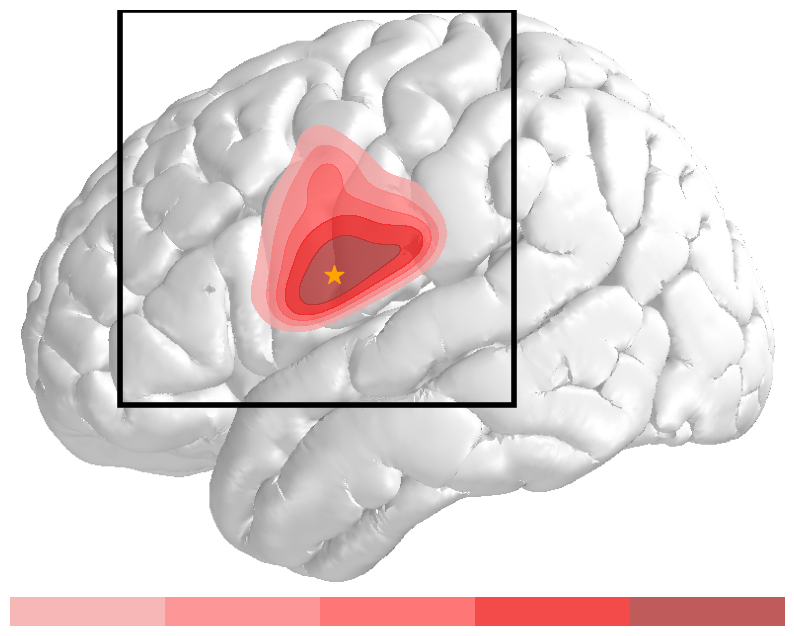

In [15]:
df_co = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3t"
)

thresh = 0.5
peak_num = 1
color = "darkred"

pdf_file_path = (
    clean_data_path +
    "figures_R3/Ext. Fig. 3t.tiff"
)

kde_map(
    df_co,
    color,
    pdf_file_path,
    thresh,
    peak_num
)

# Ext. Fig. 3u

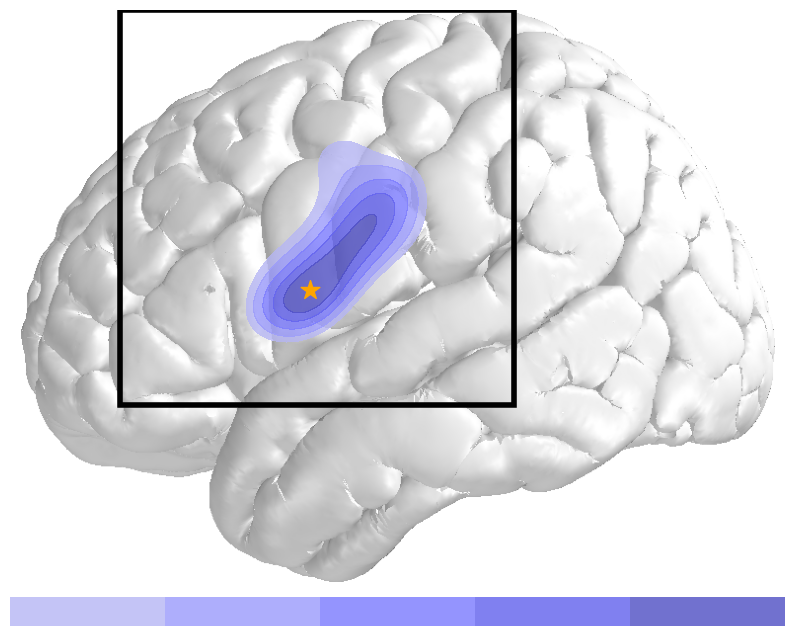

In [16]:
df_co = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3u"
)

thresh = 0.5
peak_num = 1
color = "darkblue"

pdf_file_path = (
    clean_data_path +
    "figures_R3/Ext. Fig. 3u.tiff"
)

kde_map(
    df_co,
    color,
    pdf_file_path,
    thresh,
    peak_num
)

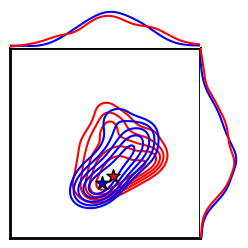

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ==========================
# Read the Source Data workbook.
# ==========================
test_df = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3v"
)

peak_df = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3v peaks"
)

# Use the peak values corresponding to Fig. 3e.
new_peak_df = peak_df[peak_df['group'].isin(['SI','SA'])]

test_col = "cluster"

palette = {
    "SA": "red",
    "shared": "darkviolet",
    "SI": "blue"
}

thresh = 0.5
levels = 6

fig = plt.figure(figsize=(3,3))

gs = fig.add_gridspec(
    2,
    2,
    width_ratios=(5,1),
    height_ratios=(1,5),
    hspace=0,
    wspace=0
)

# ==========================
# Plot the main kernel density estimate.
# ==========================
ax_main = fig.add_subplot(gs[1,0])

sns.kdeplot(
    x="x",
    y="y",
    data=test_df,
    hue=test_col,
    palette=palette,
    thresh=thresh,
    levels=levels,
    common_norm=False,
    ax=ax_main
)

# ==========================
# Mark the peak.
# ==========================
for _, row in new_peak_df.iterrows():

    ax_main.scatter(
        row["x"],
        row["y"],
        color=palette[row["group"]],
        marker="*",
        s=100,
        edgecolors="black",
        linewidths=1,
        zorder=5
    )

# ==========================
# Set the axis limits.
# ==========================
xlim_list = (100,500)
ylim_list = (400,0)

ax_main.set_xlim(*xlim_list)
ax_main.set_ylim(*ylim_list)

ax_main.legend_.remove()

ax_main.set_xticks([])
ax_main.set_yticks([])

ax_main.set_xlabel("")
ax_main.set_ylabel("")

ax_main.grid(False)

# ==========================
# Plot the marginal density above the main axes.
# ==========================
ax_x = fig.add_subplot(
    gs[0,0],
    sharex=ax_main
)

sns.kdeplot(
    x="x",
    data=test_df,
    hue=test_col,
    palette=palette,
    thresh=thresh,
    common_norm=False,
    ax=ax_x
)

ax_x.legend_.remove()

ax_x.get_xaxis().set_visible(False)

ax_x.set_xlim(*xlim_list)

ax_x.set_yticks([])
ax_x.set_ylabel("")
ax_x.grid(False)

# ==========================
# Plot the marginal density to the right of the main axes.
# ==========================
ax_y = fig.add_subplot(
    gs[1,1],
    sharey=ax_main
)

sns.kdeplot(
    x="y",
    data=test_df,
    hue=test_col,
    palette=palette,
    thresh=thresh,
    common_norm=False,
    vertical=True,
    ax=ax_y
)

ax_y.legend_.remove()

ax_y.get_yaxis().set_visible(False)

ax_y.set_xticks([])
ax_y.set_xlabel("")
ax_y.grid(False)

# ==========================
# Format the axis spines.
# ==========================
for spine in ax_x.spines.values():
    spine.set_visible(False)

for spine in ax_y.spines.values():
    spine.set_visible(False)

for spine in ax_main.spines.values():
    spine.set_visible(True)
    spine.set_color("black")
    spine.set_linewidth(2)

plt.subplots_adjust(
    wspace=0,
    hspace=0
)

plt.tight_layout()

save_path = clean_data_path + "figures_R3/Ext. Fig. 3v.tiff"

plt.savefig(
    save_path,
    dpi=300,
    transparent=True
)

plt.show()

# Kolmogorov-Smirnov test results for Extended Data Fig. 3v

In [18]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# ==========================
# Read the Source Data workbook.
# ==========================
fig3a = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3t"
)

fig3b = pd.read_excel(
    clean_data_path + "/Source_Data.xlsx",
    sheet_name="Ext. Fig. 3u"
)

# ==========================
# Compare the distributions.
# ==========================
for test_axis in ["x", "y"]:

    print(f"\nAnalyzing {test_axis} axis")

    group_SA = fig3a[test_axis]
    group_SI = fig3b[test_axis]

    # ==========================
    # Run Kolmogorov-Smirnov tests.
    # ==========================
    print("Kolmogorov-Smirnov Test Results")

    ks = stats.ks_2samp(group_SA, group_SI)
    print(
        f"SA vs SI: "
        f"D-statistic={ks.statistic:.3f}, "
        f"P={ks.pvalue:.3f}"
    )


Analyzing x axis
Kolmogorov-Smirnov Test Results
SA vs SI: D-statistic=0.126, P=0.297

Analyzing y axis
Kolmogorov-Smirnov Test Results
SA vs SI: D-statistic=0.105, P=0.514
